## 🔰*============ Summary Overview =============*🔰
  ### 🔑 To reduce training times **be sure that runtime is set to use GPU**
  #### &emsp; (menu) Runtime -> Change Runtime Type -> Hardware Accelerator -> GPU
  * Useful resourse for understanding Convolutional Neural Networks: [CNN Explainer](https://poloclub.github.io/cnn-explainer/)
  1. **Retrieve Dataset**
    * Data is a subset of the [Food101 dataset](https://data.vision.ee.ethz.ch/cvl/datasets_extra/food-101/) that include only images of Pizza & Steak
    * Link to this subset is provided by [Zero-to-Mastery](https://github.com/mrdbourke/tensorflow-deep-learning).
  2.  **Visualize the Dataset**
    * view 9 random images of steak
    * view 9 random images of pizza

  3. **Preprocess Dataset** 
    * use [TensorFlow ImageDataGenerator](https://www.tensorflow.org/api_docs/python/tf/keras/preprocessing/image/ImageDataGenerator)
    * Normalize data on interval (0,1)
    * Split data into a train, validation, and test sets
  4. **Build Models**
    * Build a very simple NN using Dense Layers as reference
    * Build a simple CNN to compare performance
    * Build a a CNN using the **[Tiny VGG architecture](https://viso.ai/deep-learning/vgg-very-deep-convolutional-networks/)**
  
  5. **Apply Data Augmentation**
    * Using Data Augmentation to overcome overfitting training data.
    * Using ImageDataGenerator set other augmentation parameters.
    * *shear, zoom, shift, and flip*.
    * Retrain models to view effects on performance.

  6. **Visualize CNN Filter Patterns**
    * Render an image after processing through the first CNN Layer.
    * Show the resulting Convolution for each output filter.
    * Display original image along side for reference.

##[CNN Explained](https://colab.research.google.com/github/rojiark/DeepLearningWorkshop/blob/master/DeepLearningWorkshop.ipynb)

**Convolutional Neural Networks** (CNNs) function by applying a **process called [convolution](https://en.wikipedia.org/wiki/Kernel_(image_processing))**.
Convolution occurs when the pixel values in an image are substituted for new values determined by sampling each pixel's neighbors by applying a dot product with a filtering matrix known as a kernel. 


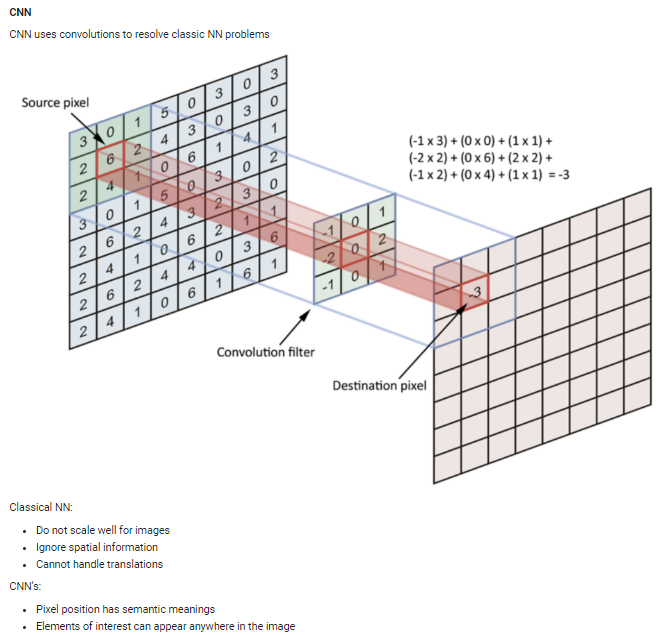

## [Max Pooling](https://www.researchgate.net/figure/Illustration-of-Max-Pooling-and-Average-Pooling-Figure-2-above-shows-an-example-of-max_fig2_333593451)

Convolution is often paired with a process known as **pooling**, whereby the outputed convolution is reduced in size by taking subsets of the convolution and applying a summary statistic like max, or average. 

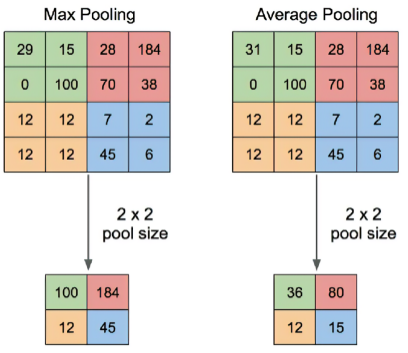

## 🔰*============ Getting Started =============*🔰
* imports and helper functions

In [1]:
#--- imports needed for retrieving data
import zipfile
import os
import pathlib
import numpy as np

In [2]:
#@title Helper Functions: unzip_files, count_files, get_class_names

def unzip_files(file_name):
  """
    Will unzip provided file.
  """
  #Unzip the downloaded file:
  zip_ref = zipfile.ZipFile(file_name)
  zip_ref.extractall()
  zip_ref.close()

def count_files(folder_name):
  """
    Displays to the user the number of files inside a folder.
  """
  #---- Review number of image files in folders:
  for dirpath, dirnames, filenames in os.walk(folder_name):
    nfiles = len(filenames)
    if nfiles:
      print(f'There are {nfiles} images in "{dirpath}".')

def get_class_names(folder_name):
  data_dir = pathlib.Path(folder_name)
  class_names = np.array(sorted([item.name for item in data_dir.glob('*')]))
  print(class_names)
  return class_names 

## 🔰*============ Retrieve data =============*🔰
  * download
  * unzip
  * count # of images
  * get class names

In [3]:
#------ Download data in zip format from provided source:
!wget https://storage.googleapis.com/ztm_tf_course/food_vision/pizza_steak.zip

--2022-05-11 01:08:13--  https://storage.googleapis.com/ztm_tf_course/food_vision/pizza_steak.zip
Resolving storage.googleapis.com (storage.googleapis.com)... 108.177.97.128, 108.177.125.128, 142.250.157.128, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|108.177.97.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 109540975 (104M) [application/zip]
Saving to: ‘pizza_steak.zip’

pizza_steak.zip     100%[===================>] 104.47M  26.3MB/s    in 4.0s    

2022-05-11 01:08:18 (26.3 MB/s) - ‘pizza_steak.zip’ saved [109540975/109540975]



In [4]:
#--- Unzip:
unzip_files("pizza_steak.zip")

In [5]:
#---- Review number of image files in folders:
count_files('pizza_steak')

There are 250 images in "pizza_steak/test/steak".
There are 250 images in "pizza_steak/test/pizza".
There are 750 images in "pizza_steak/train/steak".
There are 750 images in "pizza_steak/train/pizza".


In [6]:
class_names = get_class_names('pizza_steak/train')

['pizza' 'steak']


## 🔰*============ Visualize sample images =============*🔰
* display 9 random images from specified folder

In [16]:
#@title Helper Functions: view_random_images
def _format_ax(ax,idx,shape):
    """
      helper function for displaying images
      hides axes ticks to reduce cluttering
    """
    #--- Format axes
    ax.set_title(f'shape: {shape}')

    #--- Keep Axes ticks along edges, delete others.
    if (idx % 3):
      ax.set_yticks([])
    if (idx < 6):
      ax.set_xticks([])

def _get_random_images(folder):
  print(f'target folder: {folder}')
  return rnd.choices(os.listdir(folder),k=9)

def _show_image(folder,file,subplot):
    """
      Handles displaying an image on a specified subplot
    """
    img = mpimg.imread(f'{folder}/{file}')
    ax = plt.subplot(subplot)
    ax.imshow(img)  
    return ax,img

def _format_fig(figure,class_name):
  """
    Formats subplots to reduce whitespace
  """
  figure.suptitle(f'Images of {class_name}',
                  fontsize=15,
                  y=1.0)
  figure.tight_layout(pad=2.10,
                      h_pad=1.10,
                      w_pad=0.25)

def view_random_class_images(target_dir,target_class):
  
  #Setup the target directory:
  target_folder = f'{target_dir}/{target_class}'

  #get 9 random image names:
  random_images = _get_random_images(target_folder)

  #Setup for showing images
  images = []                 #return a list of 9 images
  fig = plt.figure(figsize=(9,9))

  #Show random images
  for ax_idx, img_name in enumerate(random_images):

    ax,img = _show_image(folder=target_folder,
                         file=img_name,
                         subplot=331+ax_idx)
    #-Format:
    _format_ax(ax=ax,
               idx=ax_idx,
               shape=img.shape)
    
    #-Append image to list 
    images.append(img)
  
  #--- Add a Title
  _format_fig(figure=fig,
              class_name=target_class)
  
  return images

In [8]:
#---- imports needed to visualize images:
import random as rnd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from matplotlib.gridspec import GridSpec

target folder: pizza_steak/train/steak


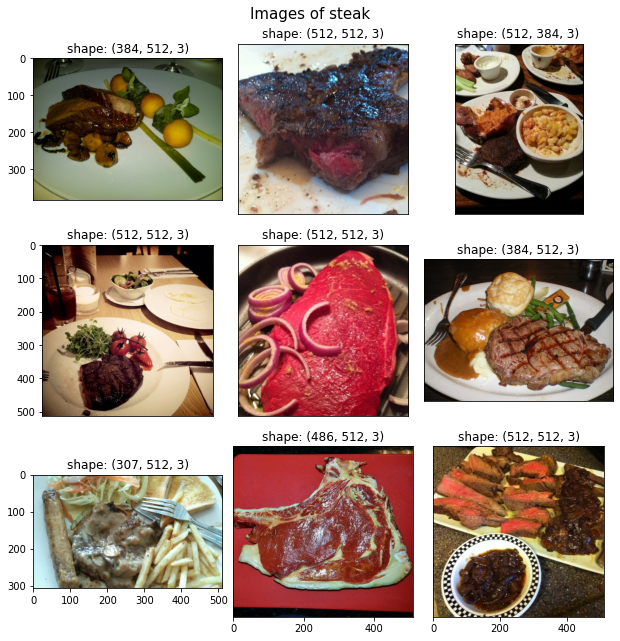

In [17]:
images = view_random_class_images('pizza_steak/train',
                                  'steak')

target folder: pizza_steak/train/pizza


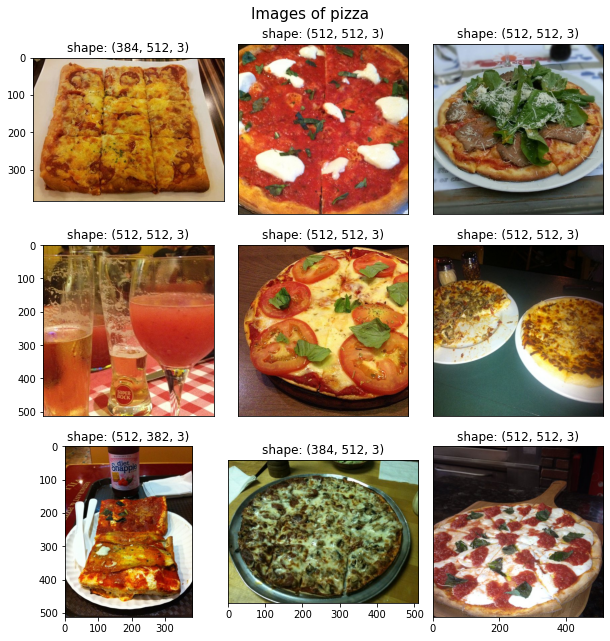

In [18]:
images = view_random_class_images('pizza_steak/train',
                                  'pizza')

## 🔰*============ Preprocess Data =============*🔰
  * apply normalization on the interval (0,1)

In [19]:
import pandas as pd
import tensorflow as tf
from tensorflow.keras.utils import plot_model
from tensorflow.keras.layers import Conv2D,MaxPool2D,Flatten,Dense,Input
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [31]:
#---Set Random Seed:
tf.random.set_seed(321)

## 🔰*============ Data Augmentation =============*🔰
  * **Data Augmentation** serves to **reduce overfitting**, meaning the model is generalizing more effectively.
  * **Transforms (modifies) data** to produce **more variation** from which the model can learn from. 
  * TensorFlow's [ImageDataGenerator](https://www.tensorflow.org/api_docs/python/tf/keras/preprocessing/image/ImageDataGenerator) provides this functionality through a number of [transforms](https://theailearner.com/2019/07/06/data-augmentation-with-keras-imagedatagenerator/):
      * rotation
      * shift: horizontal, vertical
      * brightness
      * shear
      * zoom
      * channel shift
      * flip: horizontal, vertical
      * custom function

  * Augmentation is normally **only applied on the training data**,<br>
    however there are circumstances that warrant **[Test Time Augmentation](https://towardsdatascience.com/test-time-augmentation-tta-and-how-to-perform-it-with-keras-4ac19b67fb4d)** that may help improve predictions.

  * **validation set** augmentation helps to keep convergence of training & validation losses easier to interpret and more meaningful. 

In [21]:
#@title Helper Functions: view_random_images
def _get_random_images(images,labels):
  batch_size = images.shape[0]
  random_indexes = rnd.sample(range(0,batch_size),k=9)
  r_imgs = images[random_indexes,...]
  r_labels = labels[random_indexes]
  return r_imgs,r_labels

def _show_image(image,subplot):
    """
      Handles displaying an image on a specified subplot
    """
    ax = plt.subplot(subplot)
    ax.imshow(image)  
    return ax

def _format_fig(figure):
  """
    Formats subplots to reduce whitespace
  """
  figure.suptitle(f'Images of Augmented Data',
                  fontsize=12,
                  y=0.99)
  figure.tight_layout(pad=2,
                      h_pad=0.90,
                      w_pad=0.25)

def _format_ax(ax,idx,label):
    """
      helper function for displaying images
      hides axes ticks to reduce cluttering
    """
    #--- Format axes
    text = 'Steak' if label else 'Pizza'
    ax.set_title(f'{text}')

    #--- Keep Axes ticks along edges, delete others.
    if (idx % 3):
      ax.set_yticks([])
    if (idx < 6):
      ax.set_xticks([])

def view_random_augmented_images(data):
  
  #Setup the target directory:
  target_data, target_labels = data.next()

  #get 9 random image names:
  images,labels = _get_random_images(target_data,target_labels)

  #Setup for showing images
  fig = plt.figure(figsize=(9,9))

  #Show random images
  for ax_idx, img in enumerate(zip(images,labels)):
    image, label = img
    ax = _show_image(image=image,
                     subplot=331 + ax_idx)
    #-Format:
    _format_ax(ax=ax,
               idx=ax_idx,
               label=label)
  
  #--- Add a Title
  _format_fig(figure=fig)

In [22]:
#---Create ImageDataGenerator Instances:

#--Data should be augmented for training data, but not test data
train_IDG_aug = ImageDataGenerator(rescale = 1/255.0,
                                   rotation_range = 0.2,
                                   shear_range = 0.10,
                                   zoom_range = 0.10,
                                   width_shift_range=0.08,     
                                   height_shift_range=0.08,
                                   horizontal_flip=True,
                                   validation_split=0.20)



test_IDG_aug = ImageDataGenerator(rescale = 1/255.0)

In [23]:
#--- Set Global Variables
IMG_SIZE = (224,224)
BATCH_SIZE = 32
SEED = 322
SHUFFLE = True

#--- Set path names:
train_folder = 'pizza_steak/train'
test_folder = 'pizza_steak/test'

train_data = train_IDG_aug.flow_from_directory(train_folder,
                                                   target_size=IMG_SIZE,
                                                   batch_size=BATCH_SIZE,
                                                   class_mode='binary',
                                                   shuffle=SHUFFLE,
                                                   subset='training',
                                                   seed=SEED)

valid_data = train_IDG_aug.flow_from_directory(train_folder,
                                                   target_size=IMG_SIZE,
                                                   batch_size=BATCH_SIZE,
                                                   class_mode='binary',
                                                   shuffle=SHUFFLE,
                                                   subset='validation',
                                                   seed= SEED + 1)

test_data = test_IDG_aug.flow_from_directory(test_folder,
                                             target_size=IMG_SIZE,
                                             batch_size=BATCH_SIZE,
                                             class_mode='binary',
                                             shuffle=SHUFFLE,
                                             seed= SEED + 2)

Found 1200 images belonging to 2 classes.
Found 300 images belonging to 2 classes.
Found 500 images belonging to 2 classes.


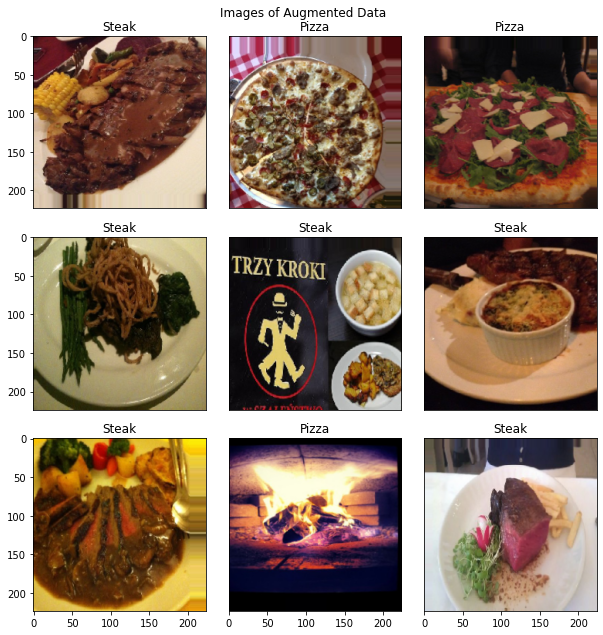

In [24]:
view_random_augmented_images(train_data)

## 🔰*============ Create a Simple Model =============*🔰

In [25]:
#@title Helper Functions: Show_Model, Training_Plot, BuildCompileFit, ContinueTraining
#---------------Build some helper functions:

def Show_Model(model,name):
    """
      Will provide a visual representation of model,
      showing layers, and input/output shapes. 
    """
    file_name = f'{name}.png'
    plot = plot_model(model,
                      to_file=file_name,
                      show_layer_activations=True,
                      show_shapes=True)
    
    plt.figure(figsize=(8,8))
    image = mpimg.imread(file_name)
    plt.imshow(image)
    plt.xticks([])
    plt.yticks([])  

def Training_Plot(history):
  """
    Will plot results from model training:
      loss,accuracy vs epochs
  """
  pd.DataFrame(history.history).plot(figsize=(10,6))
  plt.ylabel('loss')
  plt.xlabel('epochs')  


def BuildCompileFit(trn_data,val_data,layers,loss,optimizer,callbacks,metrics,
                    rndSeed,epochs,verbose=0,show_model=False,model_name='Model'):
  
  #--- Set Random Seed
  tf.random.set_seed(rndSeed)

  #--- Build Model
  model = tf.keras.Sequential(layers)

  #--- Compile Model
  model.compile(loss=loss,
                  optimizer=optimizer,
                  metrics=metrics)
  
  if show_model:
     Show_Model(model,model_name)

  #--- Fit Model:
  history=model.fit(trn_data,
                    epochs=epochs,
                    steps_per_epoch=len(trn_data),
                    callbacks=callbacks,
                    validation_data=val_data,
                    validation_steps=len(val_data),
                    verbose=verbose)


  #--- Evaluate Model
  if not verbose:
    print('\nEvaluation: ',model.evaluate(trn_data),'\n')              

  #------------------View Loss/Training Curve:
  Training_Plot(history)

  return model,history


def ContinueTraining(trn_data,val_data,model,callbacks,epochs,verbose=0):
  """
    Used to avoid recompiling a new model, 
    to continue after some initial training. 
  """

  #--- Fit Model:
  history=model.fit(trn_data,
                    epochs=epochs,
                    steps_per_epoch=len(trn_data),
                    callbacks=callbacks,
                    validation_data=val_data,
                    validation_steps=len(val_data),
                    verbose=verbose)

  #--- Evaluate Model
  if not verbose:
    print('\nEvaluation: ',model.evaluate(trn_data),'\n')              

  #------------------View Loss/Training Curve:
  Training_Plot(history)

  return model, history

In [32]:
#--- Architecture:
layers_0 = [Input(shape=(224,224,3),name='Input'),
          Flatten(input_shape=(224,224,3),name='Flatten'),
          Dense(4,activation='relu',name='D1'),
          Dense(4,activation='relu',name='D2'),
          Dense(1,activation='sigmoid',name='Output')            
          ]

Epoch 1/5
38/38 [==============================] - 24s 617ms/step - loss: 0.9609 - accuracy: 0.5025 - val_loss: 0.6932 - val_accuracy: 0.5000
Epoch 2/5
38/38 [==============================] - 22s 581ms/step - loss: 0.6932 - accuracy: 0.5000 - val_loss: 0.6932 - val_accuracy: 0.5000
Epoch 3/5
38/38 [==============================] - 22s 577ms/step - loss: 0.6932 - accuracy: 0.5000 - val_loss: 0.6932 - val_accuracy: 0.5000
Epoch 4/5
38/38 [==============================] - 22s 575ms/step - loss: 0.6932 - accuracy: 0.5000 - val_loss: 0.6932 - val_accuracy: 0.5000
Epoch 5/5
38/38 [==============================] - 23s 601ms/step - loss: 0.6932 - accuracy: 0.5000 - val_loss: 0.6931 - val_accuracy: 0.5000


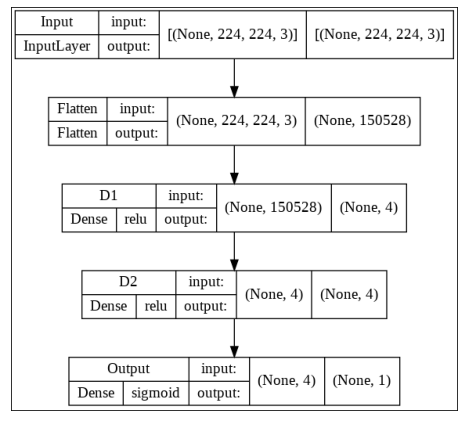

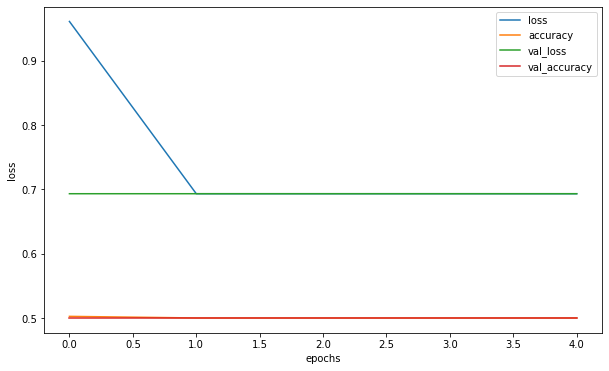

In [33]:
#--- Build, Compile, and Fit model:
model_0,history_0 = BuildCompileFit(trn_data=train_data,
                                   val_data=valid_data,
                                   layers=layers_0,
                                   loss=tf.keras.losses.BinaryCrossentropy(),
                                   optimizer=tf.keras.optimizers.Adam(),
                                   callbacks=None,
                                   metrics=['accuracy'],
                                   rndSeed=325,
                                   epochs=5,
                                   verbose=1,
                                   show_model=True)

## 🔑 The simple NN model performs **no better than random guessing**: Accuracy = 50%
## ❓ Perhaps by adjusting the architecture or hyperparameters the performance can be improved.

In [34]:
#--- Architecture:
layers_1 = [Input(shape=(224,224,3),name='Input'),
          Flatten(input_shape=(224,224,3),name='Flatten'),
          Dense(32,activation='leaky_relu',name='D1'),
          Dense(16,activation='leaky_relu',name='D2'),
          Dense(8,activation='leaky_relu',name='D3'),
          Dense(4,activation='leaky_relu',name='D4'),
          Dense(1,activation='sigmoid',name='Output')            
          ]

Epoch 1/5
38/38 [==============================] - 24s 612ms/step - loss: 1.7932 - accuracy: 0.6267 - val_loss: 0.6111 - val_accuracy: 0.7300
Epoch 2/5
38/38 [==============================] - 22s 578ms/step - loss: 0.5403 - accuracy: 0.7375 - val_loss: 0.5870 - val_accuracy: 0.7400
Epoch 3/5
38/38 [==============================] - 22s 575ms/step - loss: 0.5217 - accuracy: 0.7492 - val_loss: 0.6442 - val_accuracy: 0.6800
Epoch 4/5
38/38 [==============================] - 22s 574ms/step - loss: 0.5320 - accuracy: 0.7400 - val_loss: 0.5780 - val_accuracy: 0.6933
Epoch 5/5
38/38 [==============================] - 22s 572ms/step - loss: 0.5031 - accuracy: 0.7625 - val_loss: 0.5413 - val_accuracy: 0.7200


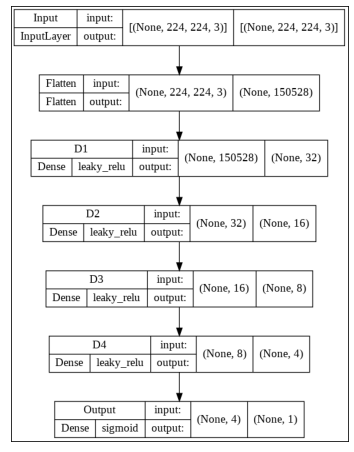

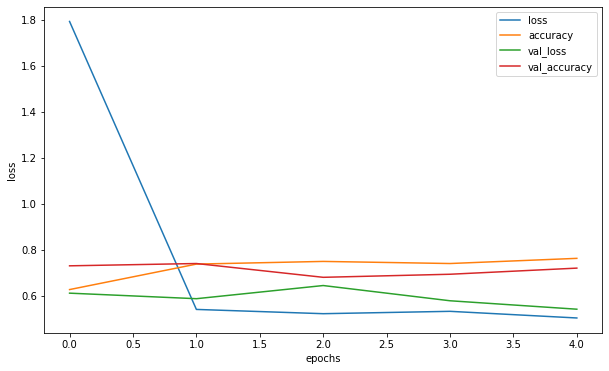

In [35]:
#--- Build, Compile, and Fit model:
model_1,history_1 = BuildCompileFit(trn_data=train_data,
                                   val_data=valid_data,
                                   layers=layers_1,
                                   loss=tf.keras.losses.BinaryCrossentropy(),
                                   optimizer=tf.keras.optimizers.Adam(),
                                   callbacks=None,
                                   metrics=['accuracy'],
                                   rndSeed=325,
                                   epochs=5,
                                   verbose=1,
                                   show_model=True)

In [37]:
#----- Evaluate Model on test Data:
model_1.evaluate(test_data)

16/16 [==============================] - 5s 306ms/step - loss: 0.4500 - accuracy: 0.7900


[0.45000389218330383, 0.7900000214576721]

## A **test accuracy of 79%** is achieved by:
  * Increasing **Width**, and **Depth** of the network
  * Changing the activation function from **relu -> [leaky_relu](https://towardsdatascience.com/7-popular-activation-functions-you-should-know-in-deep-learning-and-how-to-use-them-with-keras-and-27b4d838dfe6)**

### 🔑 The model may not improve with more training since the loss has already begun to taper.

Epoch 1/10
38/38 [==============================] - 23s 610ms/step - loss: 0.4998 - accuracy: 0.7600 - val_loss: 0.5176 - val_accuracy: 0.7633
Epoch 2/10
38/38 [==============================] - 22s 591ms/step - loss: 0.5065 - accuracy: 0.7567 - val_loss: 0.5047 - val_accuracy: 0.7633
Epoch 3/10
38/38 [==============================] - 22s 590ms/step - loss: 0.4767 - accuracy: 0.7800 - val_loss: 0.5168 - val_accuracy: 0.7667
Epoch 4/10
38/38 [==============================] - 22s 588ms/step - loss: 0.5014 - accuracy: 0.7600 - val_loss: 0.5045 - val_accuracy: 0.7867
Epoch 5/10
38/38 [==============================] - 22s 586ms/step - loss: 0.4928 - accuracy: 0.7767 - val_loss: 0.5405 - val_accuracy: 0.7300
Epoch 6/10
38/38 [==============================] - 22s 590ms/step - loss: 0.4747 - accuracy: 0.7800 - val_loss: 0.5191 - val_accuracy: 0.7867
Epoch 7/10
38/38 [==============================] - 22s 590ms/step - loss: 0.5044 - accuracy: 0.7592 - val_loss: 0.4830 - val_accuracy: 0.7967

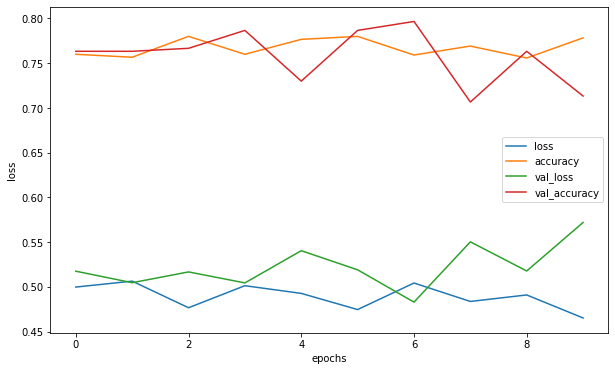

In [39]:
model_1,history_1 = ContinueTraining(trn_data=train_data,
                                     val_data=valid_data,
                                     model=model_1,
                                     callbacks=None,
                                     epochs=10,
                                     verbose=1)

In [41]:
#----- Evaluate Model on test Data:
model_1.evaluate(test_data)

16/16 [==============================] - 2s 152ms/step - loss: 0.4566 - accuracy: 0.7720


[0.45656001567840576, 0.7720000147819519]

In [42]:
model_1.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 Flatten (Flatten)           (None, 150528)            0         
                                                                 
 D1 (Dense)                  (None, 32)                4816928   
                                                                 
 D2 (Dense)                  (None, 16)                528       
                                                                 
 D3 (Dense)                  (None, 8)                 136       
                                                                 
 D4 (Dense)                  (None, 4)                 36        
                                                                 
 Output (Dense)              (None, 1)                 5         
                                                                 
Total params: 4,817,633
Trainable params: 4,817,633
No

## 🔑 After 15 epochs of training the model is able to achieve a **test accuracy of ~77%**
## 🔑 Note: the **validation loss is increasing** while the training loss is constant, suggesting the model is overfitting. This is reflected in the **decreased accuracy on the test data.**

## ❗ Note that the model required **4,817,633 parameters** to train.

## 🔰*============ Create a Simple CNN Model =============*🔰
 * For CNNs
    * **filters:** Integer, the dimensionality of the output space<br>(i.e. the number of output filters in the convolution).

    * **kernel_size:** An integer or tuple/list of 2 integers, specifying<br>the height and width of the 2D convolution window.

In [43]:
#--- Architecture:
layers_2 = [Conv2D(filters=10,            
                 kernel_size=3,
                 activation='relu',
                 input_shape=(224,224,3),name='CNN_1'),
            Flatten(name='Flatten_1'),
            Dense(1,
                activation='sigmoid',name='Output')            
          ]

Epoch 1/5
38/38 [==============================] - 31s 620ms/step - loss: 3.5071 - accuracy: 0.6708 - val_loss: 0.8619 - val_accuracy: 0.7267
Epoch 2/5
38/38 [==============================] - 23s 596ms/step - loss: 0.6117 - accuracy: 0.7450 - val_loss: 0.7893 - val_accuracy: 0.6967
Epoch 3/5
38/38 [==============================] - 23s 606ms/step - loss: 0.6075 - accuracy: 0.7400 - val_loss: 0.5796 - val_accuracy: 0.7433
Epoch 4/5
38/38 [==============================] - 24s 622ms/step - loss: 0.5395 - accuracy: 0.7658 - val_loss: 0.7503 - val_accuracy: 0.6933
Epoch 5/5
38/38 [==============================] - 23s 604ms/step - loss: 0.4528 - accuracy: 0.7992 - val_loss: 0.6029 - val_accuracy: 0.7333


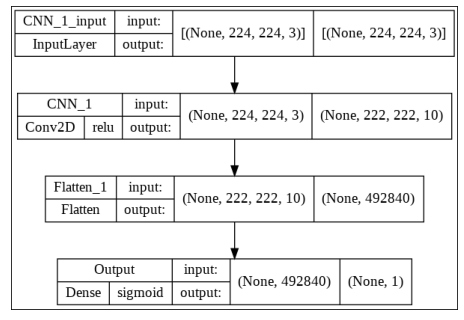

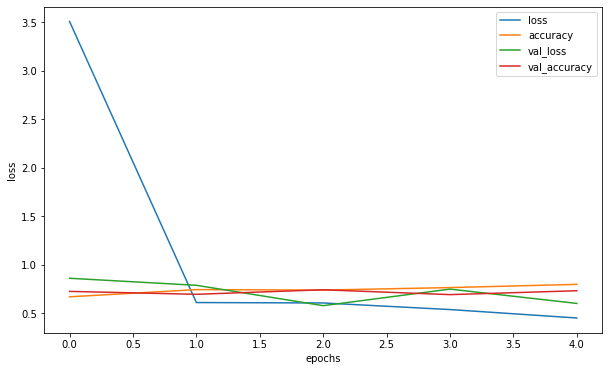

In [44]:
#--- Build, Compile, and Fit model:
model_2,history2 = BuildCompileFit(trn_data=train_data,
                                   val_data=valid_data,
                                   layers=layers_2,
                                   loss=tf.keras.losses.BinaryCrossentropy(),
                                   optimizer=tf.keras.optimizers.Adam(),
                                   callbacks=None,
                                   metrics=['accuracy'],
                                   rndSeed=325,
                                   epochs=5,
                                   verbose=1,
                                   show_model=True)

In [46]:
#----- Evaluate Model on test Data:
model_2.evaluate(test_data)

16/16 [==============================] - 4s 233ms/step - loss: 0.3944 - accuracy: 0.8200


[0.394428014755249, 0.8199999928474426]

## ⚡ Using a single convolutional layer, and a single dense layer the model can predict the test data with **82% accuracy after only 5 epochs!** 


## 🔑 It appears that the loss function has not yet fully tapered, so another round of training will be applied.

Epoch 1/10
38/38 [==============================] - 27s 698ms/step - loss: 0.4566 - accuracy: 0.8100 - val_loss: 0.4936 - val_accuracy: 0.7800
Epoch 2/10
38/38 [==============================] - 23s 607ms/step - loss: 0.4382 - accuracy: 0.8025 - val_loss: 0.5087 - val_accuracy: 0.7767
Epoch 3/10
38/38 [==============================] - 23s 607ms/step - loss: 0.4250 - accuracy: 0.8150 - val_loss: 0.5901 - val_accuracy: 0.7333
Epoch 4/10
38/38 [==============================] - 23s 608ms/step - loss: 0.4922 - accuracy: 0.7783 - val_loss: 0.5143 - val_accuracy: 0.7567
Epoch 5/10
38/38 [==============================] - 23s 608ms/step - loss: 0.4583 - accuracy: 0.8025 - val_loss: 0.4990 - val_accuracy: 0.7667
Epoch 6/10
38/38 [==============================] - 23s 610ms/step - loss: 0.4741 - accuracy: 0.7917 - val_loss: 0.5324 - val_accuracy: 0.7467
Epoch 7/10
38/38 [==============================] - 23s 608ms/step - loss: 0.4663 - accuracy: 0.7900 - val_loss: 0.6397 - val_accuracy: 0.7000

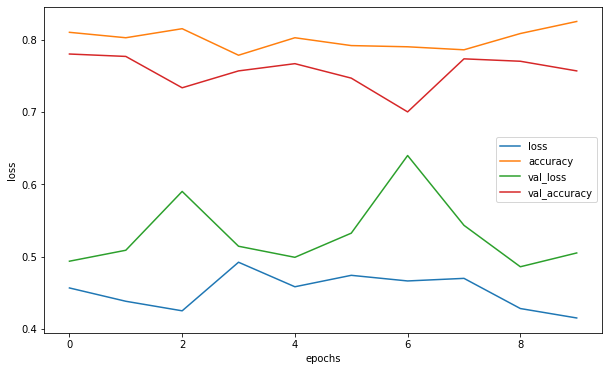

In [50]:
model_2,history_2 = ContinueTraining(trn_data=train_data,
                                     val_data=valid_data,
                                     model=model_2,
                                     callbacks=None,
                                     epochs=10,
                                     verbose=1)

In [51]:
#----- Evaluate Model on test Data:
model_2.evaluate(test_data)

16/16 [==============================] - 3s 160ms/step - loss: 0.4167 - accuracy: 0.7940


[0.41665297746658325, 0.7940000295639038]

In [52]:
model_2.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 CNN_1 (Conv2D)              (None, 222, 222, 10)      280       
                                                                 
 Flatten_1 (Flatten)         (None, 492840)            0         
                                                                 
 Output (Dense)              (None, 1)                 492841    
                                                                 
Total params: 493,121
Trainable params: 493,121
Non-trainable params: 0
_________________________________________________________________


###🔑 Despite the additional training, the model is performing worse: 79% test accuracy.<br>&emsp;&ensp; Due to the model **overfitting the training data** (divergance between training & validation loss)<br>&emsp;&ensp; and is therefore lossing the ability to generalize.


## ⚡ **Note:** However, this model required only **493,121 parameters**,<br>a **90% Reduction** in parameters to train!

## 🔰*============ Create a VGG inspired model =============*🔰
  * Use [Tiny VGG architecture](https://viso.ai/deep-learning/vgg-very-deep-convolutional-networks/)

  * Consists of consecutive blocks of 2-3 CNN layers followed by a max pooling layer.
  * Ends in 1-3 sequential Dense layers 

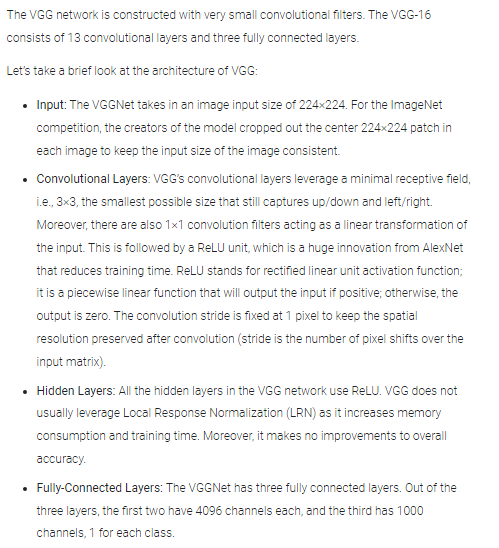

In [53]:
#--- VGG Architecture:
layers_vgg = [Conv2D(filters=10,
                 kernel_size=3,
                 activation='leaky_relu',
                 input_shape=(224,224,3)),
          Conv2D(filters=10,
                 kernel_size=3,
                 activation='leaky_relu'),
          MaxPool2D(pool_size=2,
                    padding='valid'),
          Conv2D(filters=10,
                 kernel_size=3,
                 activation='leaky_relu'),
          Conv2D(filters=10,
                 kernel_size=3,
                 activation='leaky_relu'),
          MaxPool2D(pool_size=2,
                    padding='valid'),
          Flatten(),
          Dense(1,
                activation='sigmoid')            
          ]

Epoch 1/5
38/38 [==============================] - 25s 621ms/step - loss: 0.6306 - accuracy: 0.6508 - val_loss: 0.5838 - val_accuracy: 0.7233
Epoch 2/5
38/38 [==============================] - 23s 615ms/step - loss: 0.4835 - accuracy: 0.7700 - val_loss: 0.5198 - val_accuracy: 0.7800
Epoch 3/5
38/38 [==============================] - 23s 613ms/step - loss: 0.4792 - accuracy: 0.7733 - val_loss: 0.4941 - val_accuracy: 0.7600
Epoch 4/5
38/38 [==============================] - 24s 619ms/step - loss: 0.4496 - accuracy: 0.7992 - val_loss: 0.5103 - val_accuracy: 0.7567
Epoch 5/5
38/38 [==============================] - 24s 627ms/step - loss: 0.4448 - accuracy: 0.7933 - val_loss: 0.5051 - val_accuracy: 0.7600


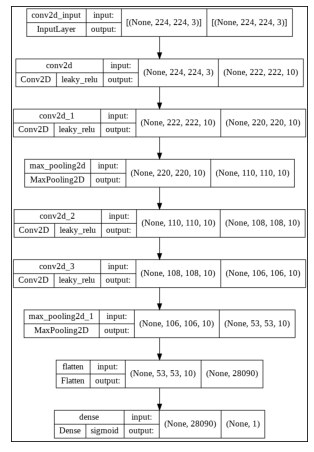

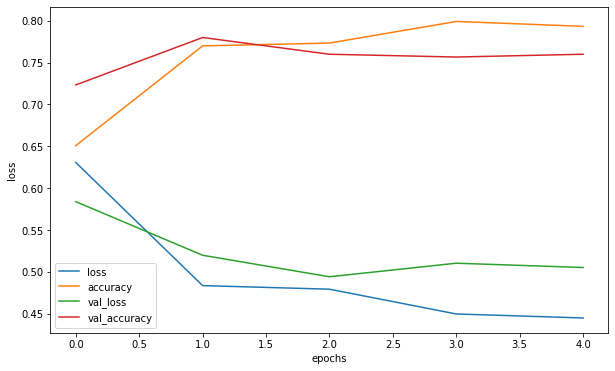

In [54]:
#--- Build, Compile, and Fit model:
model_3, history_3 = BuildCompileFit(trn_data=train_data,
                                   val_data=valid_data,
                                   layers=layers_vgg,
                                   loss=tf.keras.losses.BinaryCrossentropy(),
                                   optimizer=tf.keras.optimizers.Adam(),
                                   callbacks=None,
                                   metrics=['accuracy'],
                                   rndSeed=325,
                                   epochs=5,
                                   verbose=1,
                                   show_model=True)

In [55]:
#----- Evaluate Model on test Data:
model_3.evaluate(test_data)

16/16 [==============================] - 4s 249ms/step - loss: 0.3828 - accuracy: 0.8220


[0.38276028633117676, 0.8220000267028809]

### 🔑 This model **performs similarly** to the simple CNN model with a **training accuracy ~82% after only 5 epochs** 

Epoch 1/10
38/38 [==============================] - 24s 645ms/step - loss: 0.4437 - accuracy: 0.8100 - val_loss: 0.4891 - val_accuracy: 0.7800
Epoch 2/10
38/38 [==============================] - 24s 635ms/step - loss: 0.4403 - accuracy: 0.8025 - val_loss: 0.4576 - val_accuracy: 0.7800
Epoch 3/10
38/38 [==============================] - 24s 634ms/step - loss: 0.4465 - accuracy: 0.7992 - val_loss: 0.4515 - val_accuracy: 0.8033
Epoch 4/10
38/38 [==============================] - 24s 628ms/step - loss: 0.4143 - accuracy: 0.8142 - val_loss: 0.4678 - val_accuracy: 0.7867
Epoch 5/10
38/38 [==============================] - 24s 629ms/step - loss: 0.4048 - accuracy: 0.8275 - val_loss: 0.4329 - val_accuracy: 0.8000
Epoch 6/10
38/38 [==============================] - 24s 629ms/step - loss: 0.4145 - accuracy: 0.8217 - val_loss: 0.4547 - val_accuracy: 0.8033
Epoch 7/10
38/38 [==============================] - 24s 624ms/step - loss: 0.4052 - accuracy: 0.8225 - val_loss: 0.4336 - val_accuracy: 0.8100

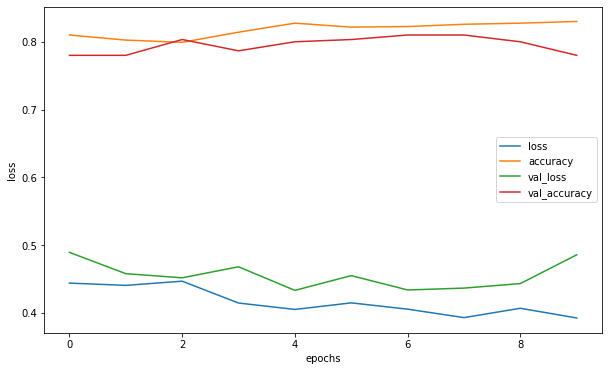

In [56]:
#---- Continue to Train for an additional 10 epochs:
model_3,history_3 = ContinueTraining(trn_data=train_data,
                                     val_data=valid_data,
                                     model=model_3,
                                     callbacks=None,
                                     epochs=10,
                                     verbose=1)

### 🔑 Note the beginning of validation & training loss **divergence** near the end of training.

In [57]:
#----- Evaluate Model on test Data:
model_3.evaluate(test_data)

16/16 [==============================] - 4s 214ms/step - loss: 0.3513 - accuracy: 0.8520


[0.3513128459453583, 0.8519999980926514]

In [59]:
model_3.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 222, 222, 10)      280       
                                                                 
 conv2d_1 (Conv2D)           (None, 220, 220, 10)      910       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 110, 110, 10)     0         
 )                                                               
                                                                 
 conv2d_2 (Conv2D)           (None, 108, 108, 10)      910       
                                                                 
 conv2d_3 (Conv2D)           (None, 106, 106, 10)      910       
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 53, 53, 10)       0         
 2D)                                                  

## ⚡ The Tiny-VGG inspired model achieves a **test accuracy ~= 85%**<br>&emsp;&ensp;but **only requires 31,101 trainable parameters**, a **99% reduction!**

# 🔑 Interestingly, all the models seem to begin overfitting after approximately 10 epochs. 

## 🔑 A plausible explanation of the superior performance of the models on the test data is that:
    
##   &emsp; 1. The model begins to overfit the training data.
##   &emsp; 2. The test data is more like the training data than the validation data. 

## 🔰*============ Visualize CNN Filter Views =============*🔰

  * Visualize Filter view of a **Pizza** by Layer
  * Visualize Filter view of a **Steak** by Layer

In [61]:
#@title Helper Functions: **show_image_cnn_filter_view, get_batch, get_outputs**

def _make_figure(layer_name,depth,shape):
  """
    Create a matplotlib figure and add a title
  """
  fig = plt.figure(figsize=(18,6),tight_layout={'pad':1.5,'h_pad':1.5,'w_pad':1.5})
  fig.suptitle(f'Layer {layer_name}, Depth {depth}, Shape {shape}',
               fontsize=15,color='red',
               x=0.36,
               y=1.025)

  return fig


def _make_axes(figure):
  """
    Will set up layout of axes on figure:
    Left: 10 axes for CNN filters, 
    Right: 4 axes (combined) for original image

           Left                 Right       
    fax0 fax1 fax2 fax3 fax4 | Img Img
    - - - - - - - - - - - - -| 
    fax5 fax6 fax7 fax8 fax9 | Img Img

  """
  gs = GridSpec(2,7,figure=figure)
  Laxes = []
  Rax = figure.add_subplot(gs[:,5:])

  for row in range(0,2):
    for col in range(0,5):
      ax = figure.add_subplot(gs[row,col])
      Laxes.append(ax)

  return Laxes,Rax  


def _display_original_image(image,ax,label):
  """
    Displays input image for reference. 
  """
  ax.imshow(image)
  ax.set_xticks([])
  ax.set_yticks([])
  text = 'Steak' if int(label) else 'Pizza'
  ax.set_title(text,fontsize=20)    

def _format_filter_ax(ax,idx):
  """
    reduce clutter on filter image axes by removing x-axis, and y-axis ticks. 
  """
  ax.set_title(f'filter {idx}',fontsize=10)
  ax.set_xticks([]) 
  ax.set_yticks([])

def _get_min_max(output):
  """
    used to provide consistant color scaling accross filter images.
    finds the global min, max values for all filter views. 
  """
  if 'dense' not in output.layer_name:
    min = tf.reduce_min(output).numpy()
    max = tf.reduce_max(output).numpy()
  else:
    min = None
    max = None
  return min,max

def _get_dense_layer_view(outputs,layers,layer_idx):
    """
      CNNs & Maxpools have a 'Filter View' however,
      Dense layers have a 'Neuron View' and need
      to be calculated differently. 
    """
    #--Search for the closest Non-Flattened layer
    idx = layer_idx
    while idx > 0:
      idx -= 1
      if len(outputs[idx].shape) > 2:
        reshape_dense_view = outputs[idx].shape
        break

    #--Calculate Dense Layer Neuron View:
    dense_weights = tf.squeeze(layers[layer_idx].weights[0])
    output = np.reshape(outputs[layer_idx-1] * dense_weights,reshape_dense_view)
    output = tf.constant(output)

    #--Store information to be held for axes & figure formatting
    output.layer_name = outputs[layer_idx].layer_name
    output.layer_idx = layer_idx

    return output

def show_image_cnn_filter_view(outputs,images,labels,layers,layer_idx,img_idx,cmap):
  """
    Displays the results of each filter after processing an image,
    along with the original image.
  """
  #----Setup:
  output = outputs[layer_idx]
  image = images[img_idx,:,:,:]
  im_shape = output.shape[1:-1]
  is_dense = False

  if 'dense' in output.layer_name:
    output = _get_dense_layer_view(outputs,layers,layer_idx)
    im_shape = output.shape[1:-1]

  fig = _make_figure(layer_name=output.layer_name,
                     depth=output.layer_idx,
                     shape=im_shape)
  
  Laxes,Rax = _make_axes(fig)

  #------------- Display Right Side Image
  _display_original_image(image=image,
                          ax=Rax,
                          label=labels[img_idx])
  
  #------------- Display Left Side Images:
  #--Get Min,Max values for consistent color scaling
  min_val,max_val = _get_min_max(output)
  
  #--Display filter 'view'
  for filter_idx,ax in enumerate(Laxes):
    filter_view = output[img_idx,:,:,filter_idx]
    img = ax.imshow(filter_view,
                    cmap=cmap,
                    vmin=min_val,
                    vmax=max_val)
    
    _format_filter_ax(ax=ax,
                      idx=filter_idx)



def get_batch(data_batches,batch_idx):
  data_batches.reset()
  for bidx, data in enumerate(data_batches):
    batch_images, batch_labels = data

    if bidx == batch_idx:
      break

  """
  #--Rest total_batches_seen, this is a factor in generating batches.
     Otherwise a new random set of images make up the same 'batch'
     and passing the same batch_idx will result in a different image. 
  """
  data_batches.total_batches_seen -= batch_idx + 1 #<--- This allows repeatability!  
  
  return batch_images, batch_labels


def get_outputs(batch_images,layers):
  """
    Will save the outputs of each layer. 
  """
  #-- Setup
  outputs = []
  output = batch_images
  for Lidx,layer in enumerate(layers):
    output = layer(output)         #-- Replaces previous layer output, with current layer output.   
    output.layer_name = layer.name #-- Label Layer Output
    output.layer_idx = Lidx
    outputs.append(output)         #-- Add to list
#    if Lidx == layer_idx:
#     break

  return outputs 

In [62]:
print(f'Maximum Batch Index: {len(train_data)-1}')

Maximum Batch Index: 37


In [63]:
#--- Will retrieve a batch of 32 images & Labels
batch_images, batch_labels= get_batch(data_batches=train_data,
                                      batch_idx=0)             #Batch Index for the purposes of Visuals below batches are static ()

In [64]:
#--- For a CNN this is the POST processing (filter) view, For a Dense Layer it is a PRE processing (weights) view
outputs = get_outputs(batch_images=batch_images,
                      layers=layers_vgg)                 

## 🔰*============ Visualize Pizza =============*🔰
  * VGG model
  * 6 layers total
  * Flatten layer (layer index 6) is skipped

In [ ]:
#steak: 7
#pizza 20,22,23,27,28

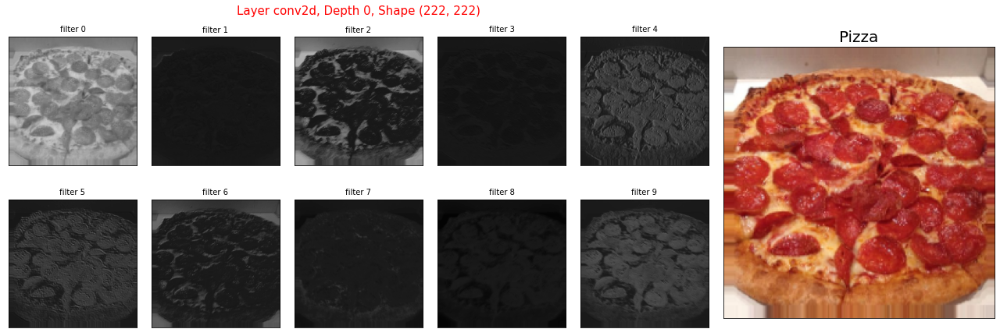

In [97]:
idx_pizza = 27
color_scale = 'Greys_r'
show_image_cnn_filter_view(outputs=outputs,
                           images=batch_images,
                           labels= batch_labels,
                           layers=layers_vgg,
                           layer_idx = 0,
                           img_idx=idx_pizza,
                           cmap=color_scale)

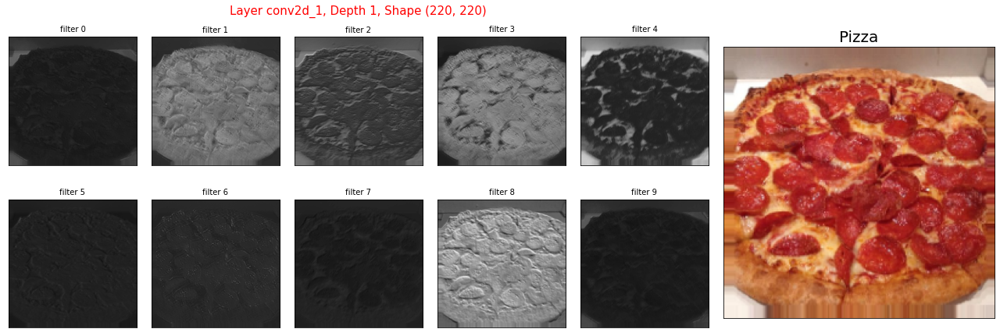

In [98]:
show_image_cnn_filter_view(outputs=outputs,
                           images=batch_images,
                           labels= batch_labels,
                           layers=layers_vgg,
                           layer_idx = 1,
                           img_idx=idx_pizza,
                           cmap=color_scale)

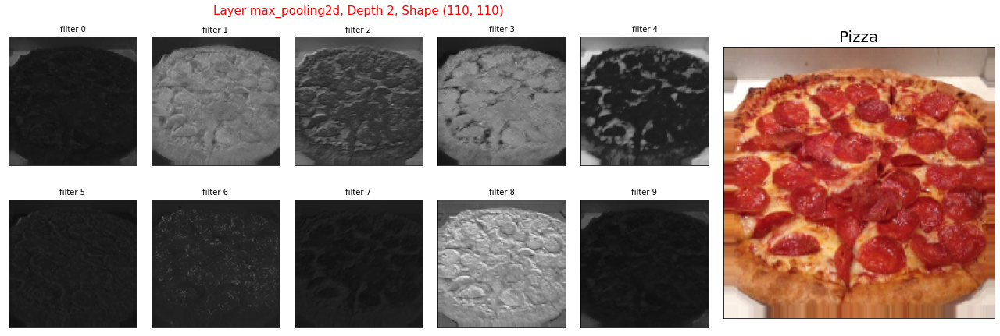

In [100]:
show_image_cnn_filter_view(outputs=outputs,
                           images=batch_images,
                           labels= batch_labels,
                           layers=layers_vgg,
                           layer_idx = 2,
                           img_idx=idx_pizza,
                           cmap=color_scale)

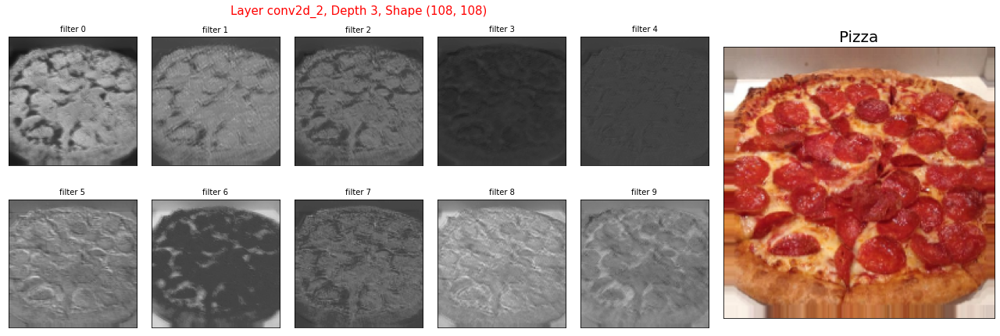

In [102]:
show_image_cnn_filter_view(outputs=outputs,
                           images=batch_images,
                           labels= batch_labels,
                           layers=layers_vgg,
                           layer_idx = 3,
                           img_idx=idx_pizza,
                           cmap=color_scale)

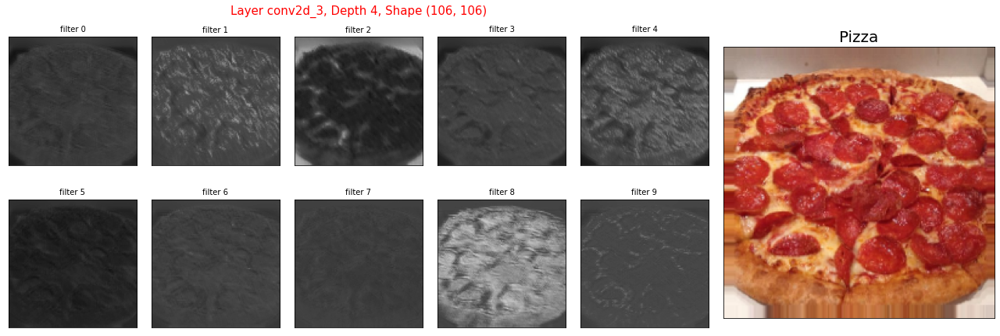

In [103]:
show_image_cnn_filter_view(outputs=outputs,
                           images=batch_images,
                           labels= batch_labels,
                           layers=layers_vgg,
                           layer_idx = 4,
                           img_idx=idx_pizza,
                           cmap=color_scale)

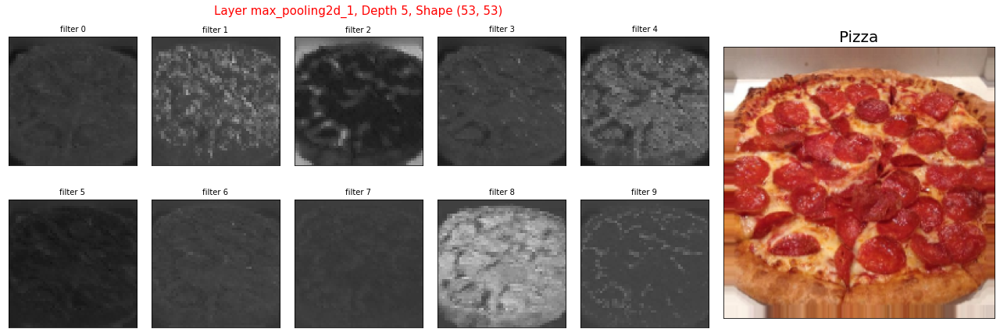

In [104]:
show_image_cnn_filter_view(outputs=outputs,
                           images=batch_images,
                           labels= batch_labels,
                           layers=layers_vgg,
                           layer_idx = 5,
                           img_idx=idx_pizza,
                           cmap=color_scale)

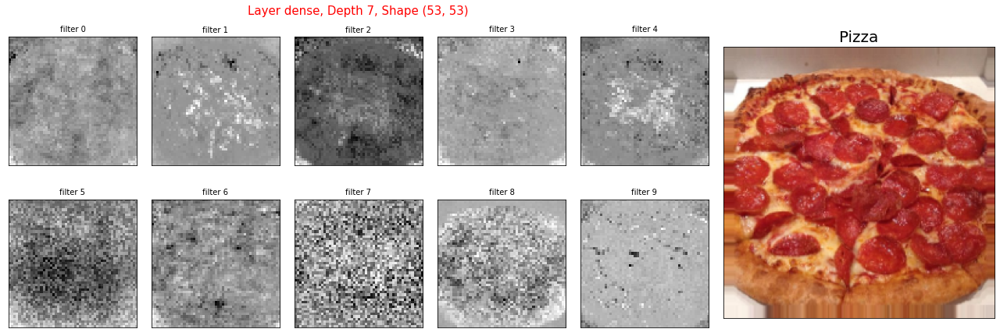

In [105]:
show_image_cnn_filter_view(outputs=outputs,
                           images=batch_images,
                           labels= batch_labels,
                           layers=layers_vgg,
                           layer_idx = 7,
                           img_idx=idx_pizza,             
                           cmap=color_scale) 

# 🔰*============ Visualize Steak =============*🔰
  * VGG model
  * 6 layers total
  * Flatten layer (layer index 6) is skipped

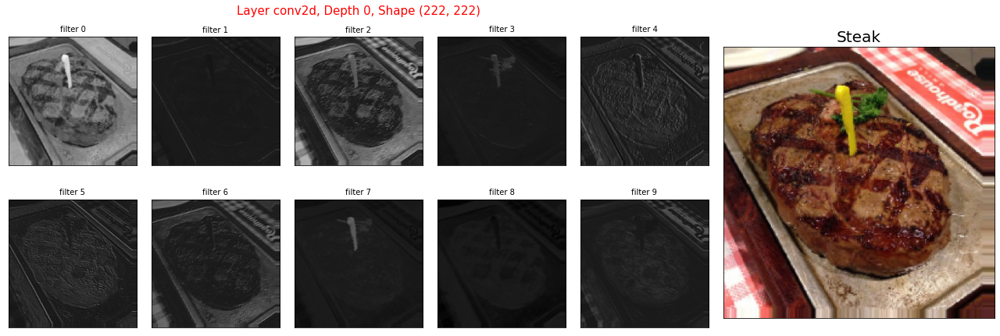

In [106]:
idx_steak = 7
show_image_cnn_filter_view(outputs=outputs,
                           images=batch_images,
                           labels= batch_labels,
                           layers=layers_vgg,
                           layer_idx = 0,
                           img_idx=idx_steak,             
                           cmap=color_scale) 

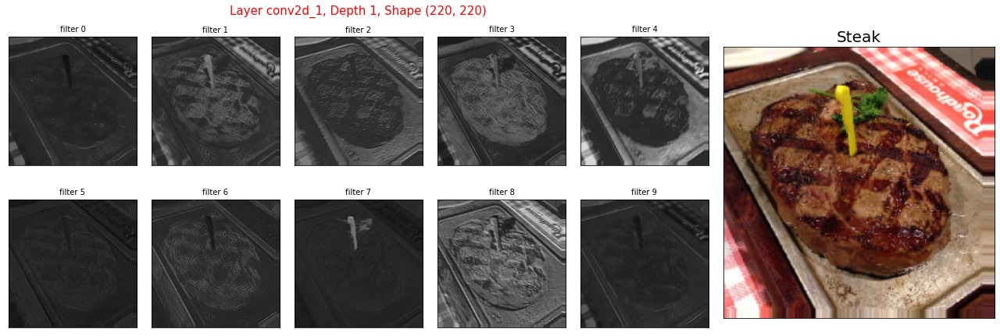

In [107]:
show_image_cnn_filter_view(outputs=outputs,
                           images=batch_images,
                           labels= batch_labels,
                           layers=layers_vgg,
                           layer_idx = 1,
                           img_idx=idx_steak,             
                           cmap=color_scale) 

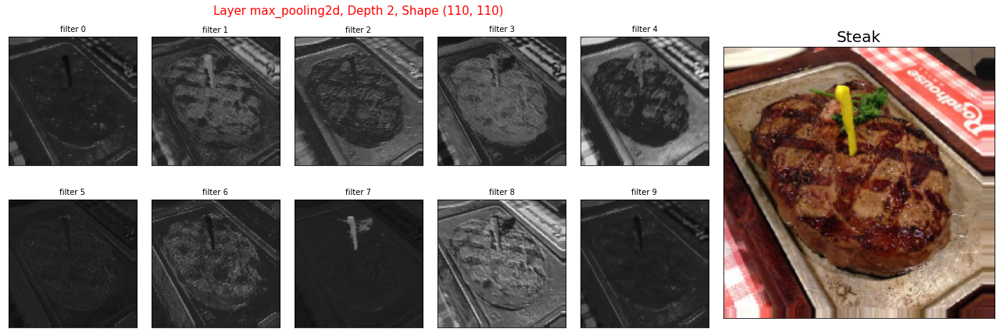

In [108]:
show_image_cnn_filter_view(outputs=outputs,
                           images=batch_images,
                           labels= batch_labels,
                           layers=layers_vgg,
                           layer_idx = 2,
                           img_idx=idx_steak,             
                           cmap=color_scale) 

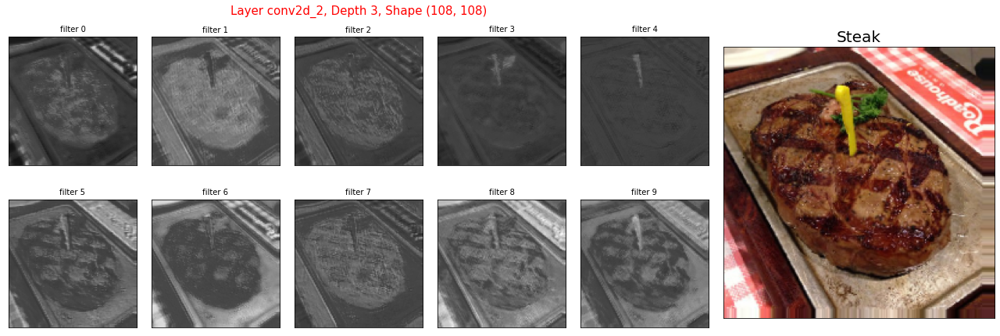

In [109]:
show_image_cnn_filter_view(outputs=outputs,
                           images=batch_images,
                           labels= batch_labels,
                           layers=layers_vgg,
                           layer_idx = 3,
                           img_idx=idx_steak,             
                           cmap=color_scale) 

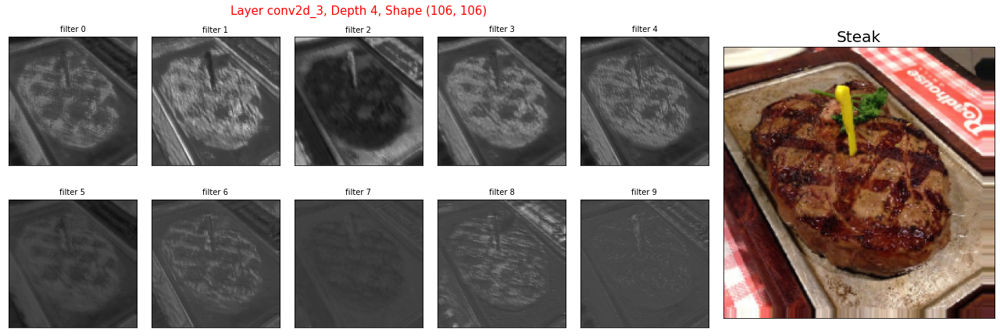

In [110]:
show_image_cnn_filter_view(outputs=outputs,
                           images=batch_images,
                           labels= batch_labels,
                           layers=layers_vgg,
                           layer_idx = 4,
                           img_idx=idx_steak,             
                           cmap=color_scale) 

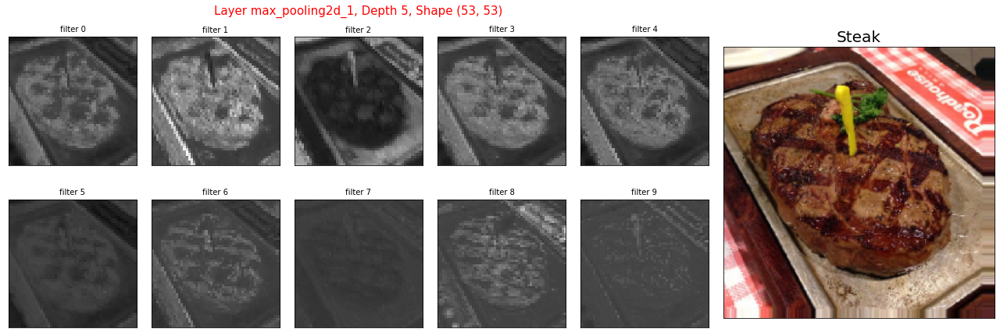

In [111]:
show_image_cnn_filter_view(outputs=outputs,
                           images=batch_images,
                           labels= batch_labels,
                           layers=layers_vgg,
                           layer_idx = 5,
                           img_idx=idx_steak,             
                           cmap=color_scale) 

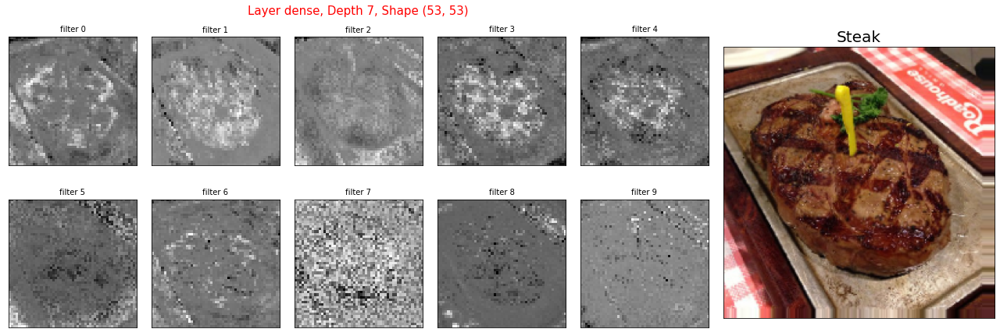

In [135]:
show_image_cnn_filter_view(outputs=outputs,
                           images=batch_images,
                           labels= batch_labels,
                           layers=layers_vgg,
                           layer_idx = 7,
                           img_idx=idx_steak,             
                           cmap=color_scale) 